In [1]:
import numpy as np
import pandas as pd
import os
from IPython.display import display, HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
import joblib

import seaborn as sns
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib
import warnings
from IPython.display import display, HTML
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import numpy as np
import shap 
import lime# SHAP for explainability
from lime.lime_tabular import LimeTabularExplainer  # LIME for local explanations
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import pandas as pd
import time
import copy
import matplotlib.pyplot as plt
import seaborn as sns
import random
import tensorflow as tf





# Configure Jupyter Notebook
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', 500) 
pd.set_option('display.expand_frame_repr', False)
# pd.set_option('max_colwidth', -1)
display(HTML("<style>div.output_scroll { height: 35em; }</style>"))

reload(plt) #ensures any changes made to matplotlib.pyplot during the session are applied.
%matplotlib inline
%config InlineBackend.figure_format ='retina'

warnings.filterwarnings('ignore')

# configure plotly graph objects
pio.renderers.default = 'iframe'
# pio.renderers.default = 'vscode'

pio.templates["ck_template"] = go.layout.Template(
    layout_colorway = px.colors.sequential.Viridis, 
#     layout_hovermode = 'closest',
#     layout_hoverdistance = -1,
    layout_autosize=False,
    layout_width=800,
    layout_height=600,
    layout_font = dict(family="Calibri Light"),
    layout_title_font = dict(family="Calibri"),
    layout_hoverlabel_font = dict(family="Calibri Light"),
#     plot_bgcolor="white",
)
 
# pio.templates.default = 'seaborn+ck_template+gridon'
pio.templates.default = 'ck_template+gridon'
# pio.templates.default = 'seaborn+gridon'
# pio.templates

c:\Users\tonya\Anaconda3\envs\fl_project_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:

df_train = pd.read_csv('dataset/train_edge_iiot.csv', low_memory=False)
df_test = pd.read_csv('dataset/test_edge_iiot.csv', low_memory=False)

In [ ]:
X_train = df_train.drop(columns=['Attack_type','Attack_label'])
X_test = df_test.drop(columns=['Attack_type','Attack_label'])
y_train  = df_train['Attack_type'].values
y_test = df_test['Attack_type'].values


In [ ]:

# Set Random Seed
seed = 42
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)
hidden_layer_sizes = (20, 20)  # Hidden layer configuration
batch_size = 2000  # Batch size for MLP
learning_rate = 0.001  # Learning rate for MLP


from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score

# Re-initialize the model to ensure clean start
model = MLPClassifier(
    hidden_layer_sizes=hidden_layer_sizes,
    activation='relu',
    solver='adam',
    batch_size=batch_size,
    learning_rate_init=learning_rate,
    max_iter=1,  # Train for 1 epoch at a time
    warm_start=True,  # Keep training without reinitializing weights
    verbose=False
)


train_time = time.time()

for epoch in range(10):
    model.fit(X_train, y_train)

# Final evaluation
y_pred = model.predict(X_test)



accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average="weighted")
recall = recall_score(y_test, y_pred, average="weighted")
f1 = f1_score(y_test, y_pred, average="weighted")


print("\nEvaluation on test set:")
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print(f"Training time: {time.time() - train_time:.2f} seconds")




Evaluation on test set:
              precision    recall  f1-score   support

           0       0.85      0.79      0.82      4745
           1       0.91      0.92      0.92      9666
           2       1.00      1.00      1.00     13529
           3       1.00      1.00      1.00      9893
           4       1.00      1.00      1.00     24284
           5       0.91      0.43      0.59       162
           6       1.00      0.97      0.98        65
           7       1.00      1.00      1.00    272741
           8       0.77      0.86      0.81     10073
           9       0.93      1.00      0.96      4021
          10       0.58      0.60      0.59      1964
          11       0.97      0.74      0.84     10285
          12       0.75      0.88      0.81      7314
          13       0.98      0.94      0.96     10049
          14       0.79      0.85      0.82      3144

    accuracy                           0.98    381935
   macro avg       0.90      0.87      0.87    381935
w

In [22]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import classification_report, confusion_matrix

# clf = RandomForestClassifier(random_state=42)
# clf.fit(X_train, y_train)
# y_pred = clf.predict(X_test)

# print(confusion_matrix(y_test, y_pred))
# print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


In [38]:
y_test

1692608     7
1710200     7
245143      7
1419092     7
538993      1
           ..
674258      7
683063      7
1130658     7
1691632    13
1497010     7
Name: Attack_type, Length: 381935, dtype: int64

In [ ]:
from lime.lime_tabular import LimeTabularExplainer
from IPython.display import display, HTML
from lime.explanation import Explanation
import numpy as np

# === LIME Explainability for Centralized Model ===
print(f"\nGenerating LIME explanations for a sample prediction...")

try:
    # Define LIME Explainer
    lime_explainer = LimeTabularExplainer(
        training_data=X_train.values,
        feature_names=X_train.columns.tolist(),
        class_names=[str(cls) for cls in np.unique(y_test)],
        mode="classification"
    )
    
    # Generate explanation for a sample instance (e.g., first test instance)
    sample_idx = 4  # You can change this to any index
    sample_instance = X_test.iloc[sample_idx].values
    
    # Generate explanation
    explanation = lime_explainer.explain_instance(
        sample_instance,
        model.predict_proba,  # Assuming 'model' is your trained model
        num_features=len(X_train.columns),  # Show all features
        top_labels=len(np.unique(y_test))   # Show all classes
    )
    
    # Display explanation in notebook
    explanation.show_in_notebook(show_table=True)
    
    # Optional: Save as HTML
    explanation.save_to_file('lime_explanation.html')
    
    # Print feature importance for the predicted class
    predicted_class = model.predict([sample_instance])[0]
    print(f"\nActual label: {y_test[sample_idx]}")
    print(f"Predicted label: {predicted_class}")
    print(f"Prediction probability: {model.predict_proba([sample_instance])[0]}")
    
    # Get feature importance as list
    exp_list = explanation.as_list(label=predicted_class)
    print(f"\nTop feature contributions for predicted class {predicted_class}:")
    for feature, importance in exp_list[:5]:  # Top 5 features
        print(f"  {feature}: {importance:.4f}")
        
except Exception as e:
    print(f"Error generating LIME explanation: {e}")
    print("Make sure you have:")
    print("- X_train, X_test, y_test defined")
    print("- A trained model with predict_proba method")
    print("- LIME library installed: pip install lime")


Generating LIME explanations for a sample prediction...



Actual label: 1
Predicted label: 1
Prediction probability: [8.53983145e-18 8.68634752e-01 3.57842801e-14 2.15400371e-49
 1.59455639e-26 1.98472582e-08 8.54404174e-13 1.48513758e-14
 7.51412144e-05 3.11279622e-10 1.49086716e-14 7.68801741e-05
 6.35160842e-09 3.78001999e-02 9.34130003e-02]

Top feature contributions for predicted class 1:
  mbtcp.unit_id <= -0.01: -0.4476
  encoder__http.request.version_- <= 0.00: -0.0301
  encoder__http.referer_0 > 0.00: 0.0289
  icmp.checksum <= -0.19: -0.0287
  tcp.connection.fin <= -0.34: -0.0185



Generating SHAP explanations...
Creating background summary with 100 samples...
Model has 15 classes
Explaining first 15 classes...

Explaining class 0...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 62.12it/s]


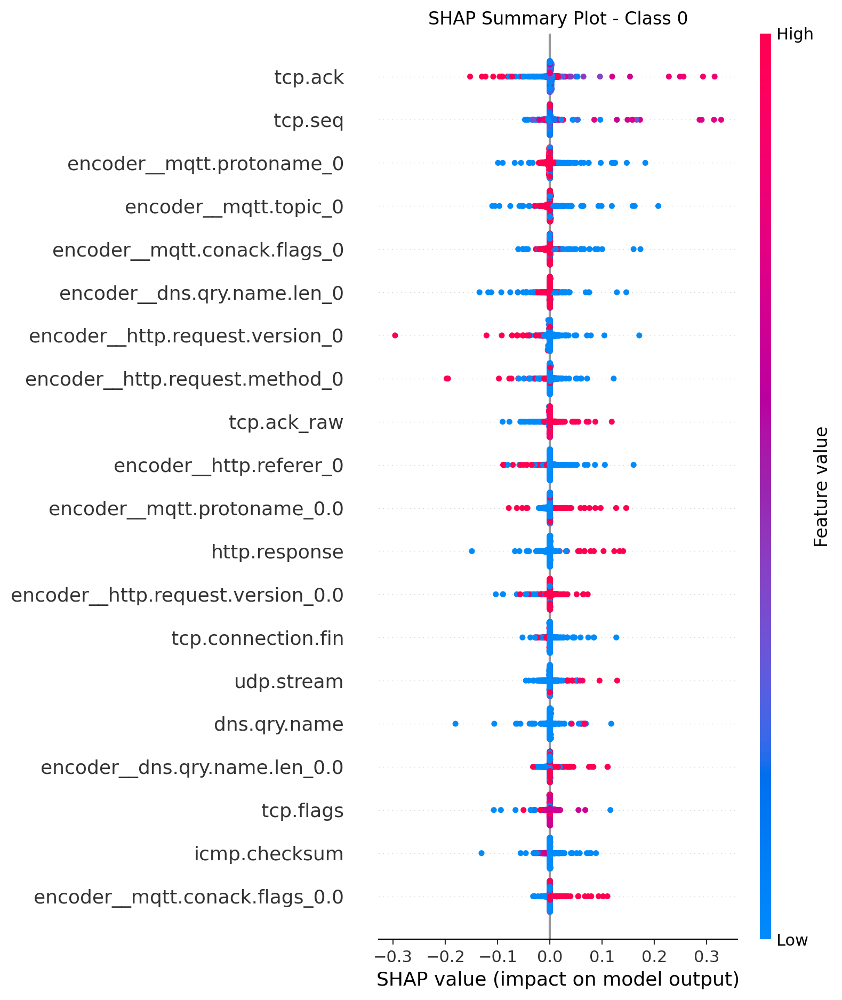

Creating waterfall plot for class 0...


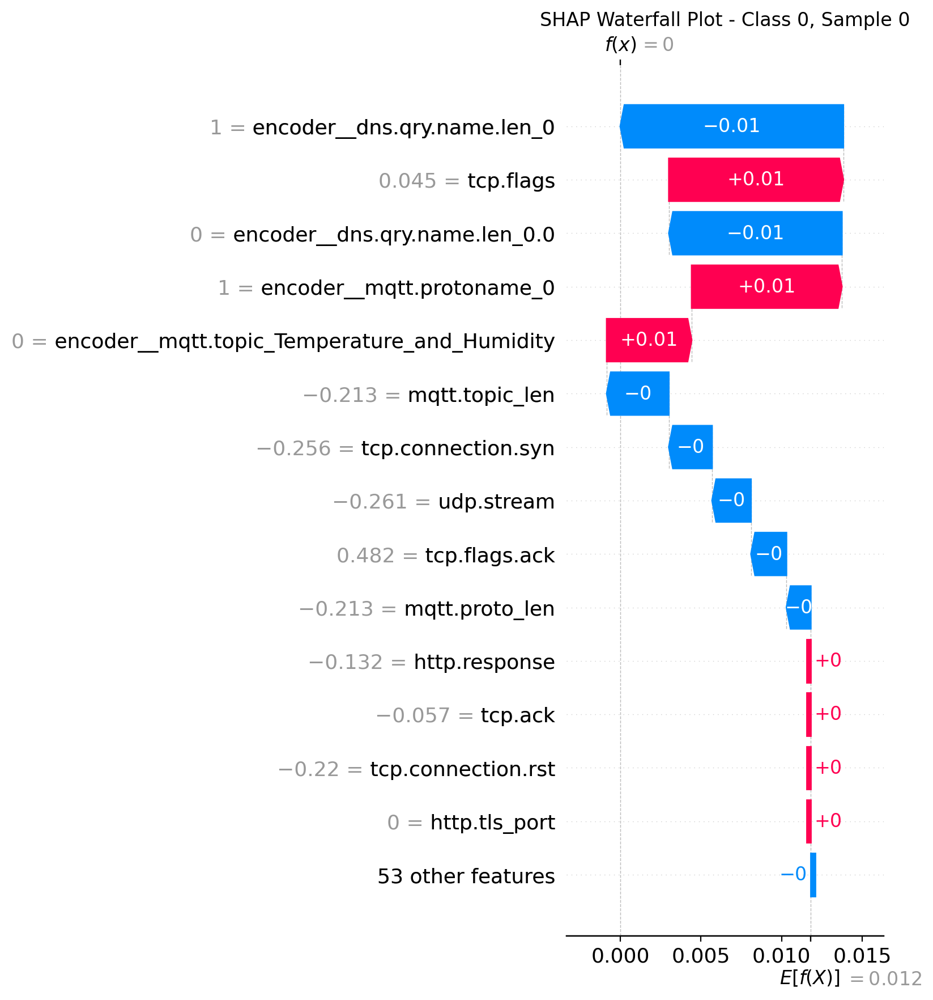


Explaining class 1...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 61.71it/s]


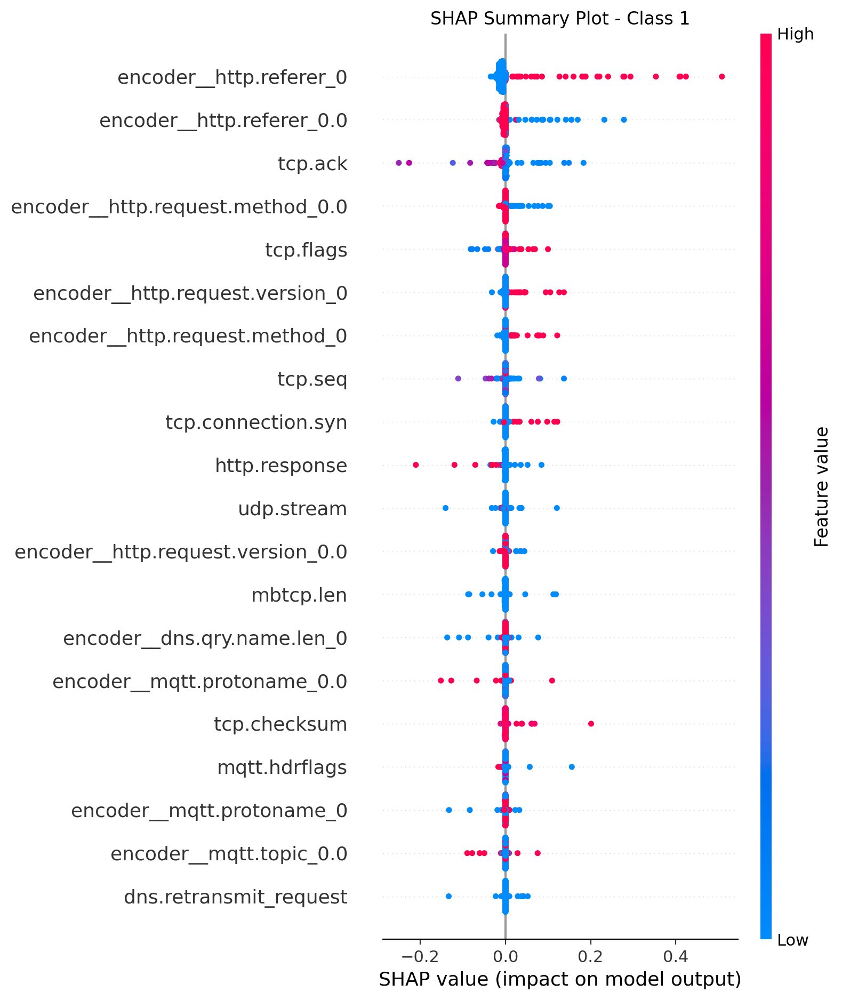

Creating waterfall plot for class 1...


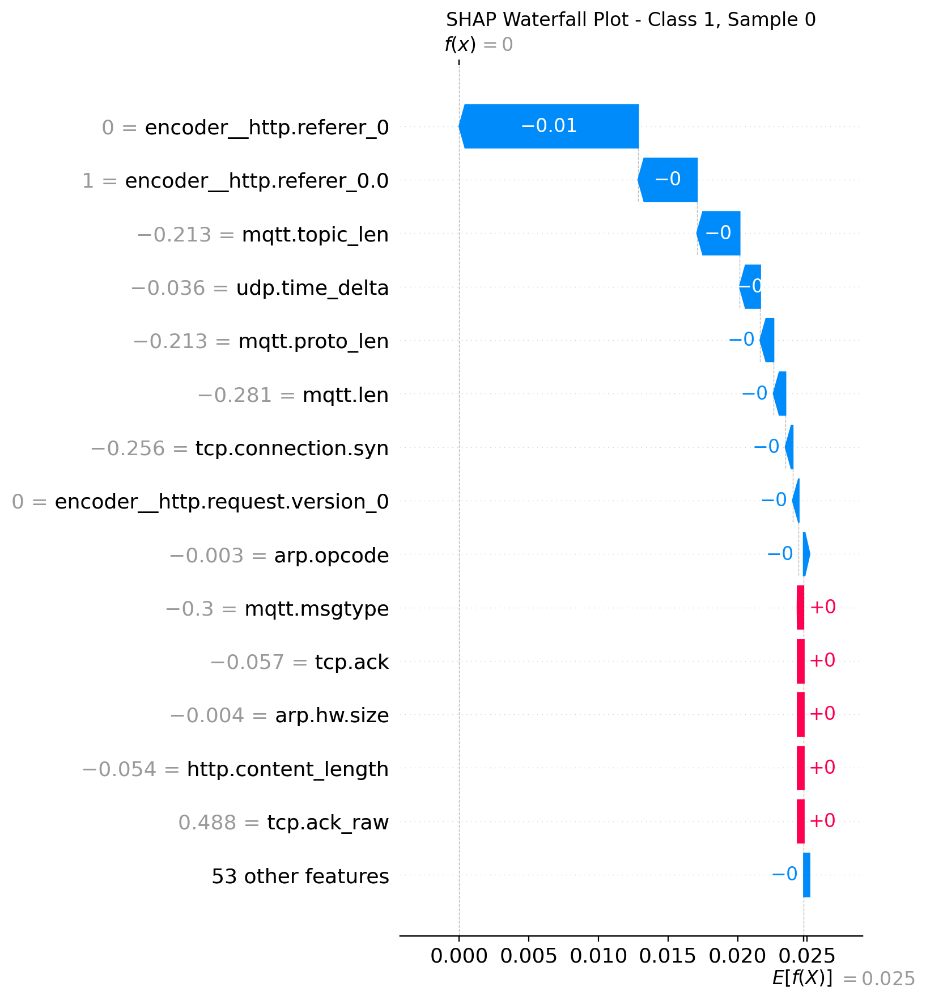


Explaining class 2...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 62.39it/s]


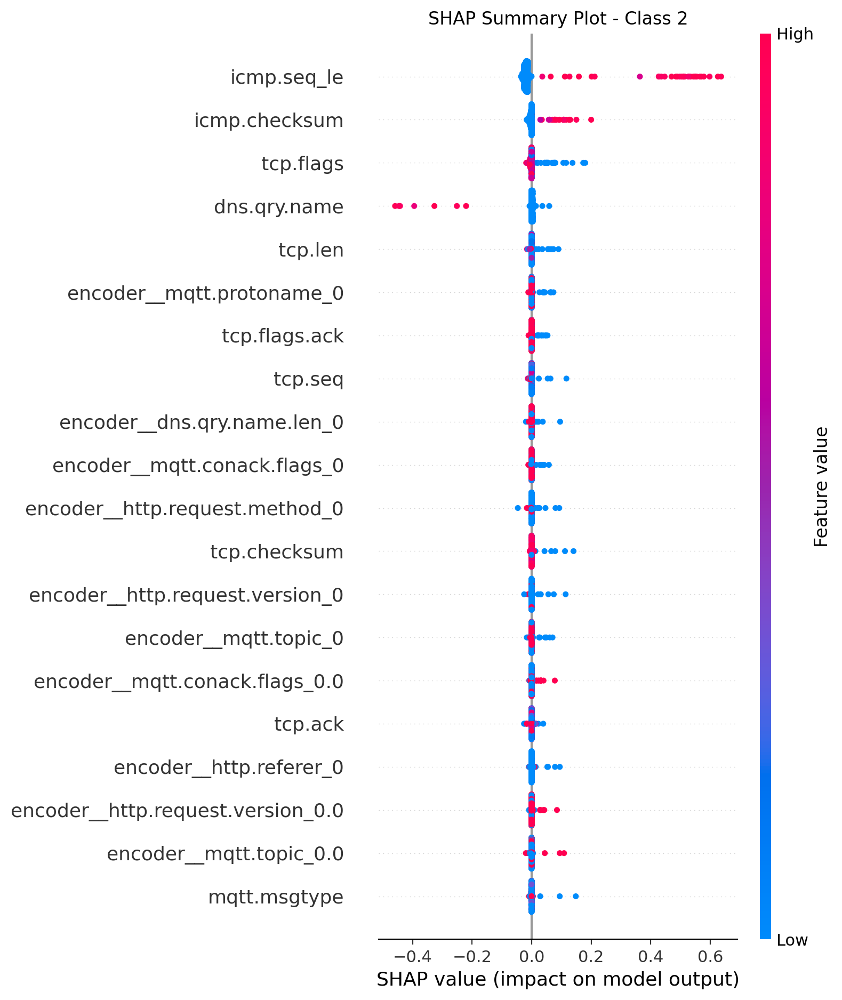

Creating waterfall plot for class 2...


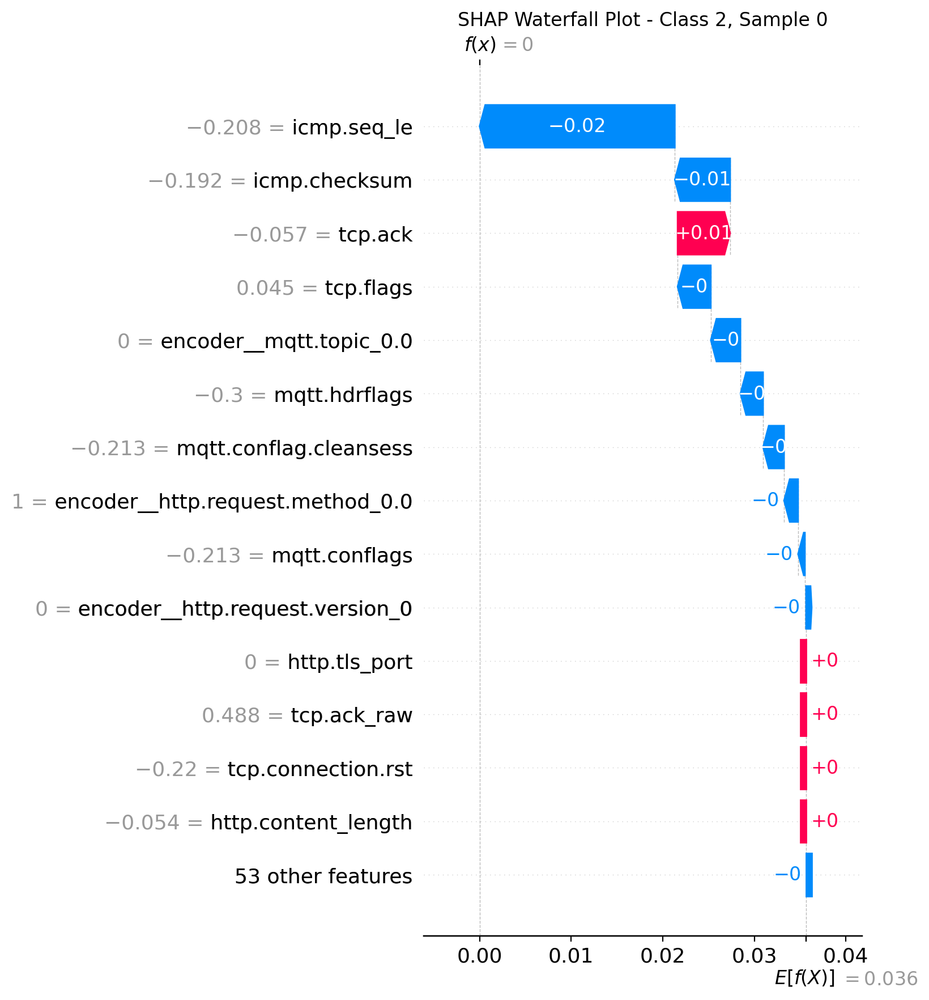


Explaining class 3...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.34it/s]


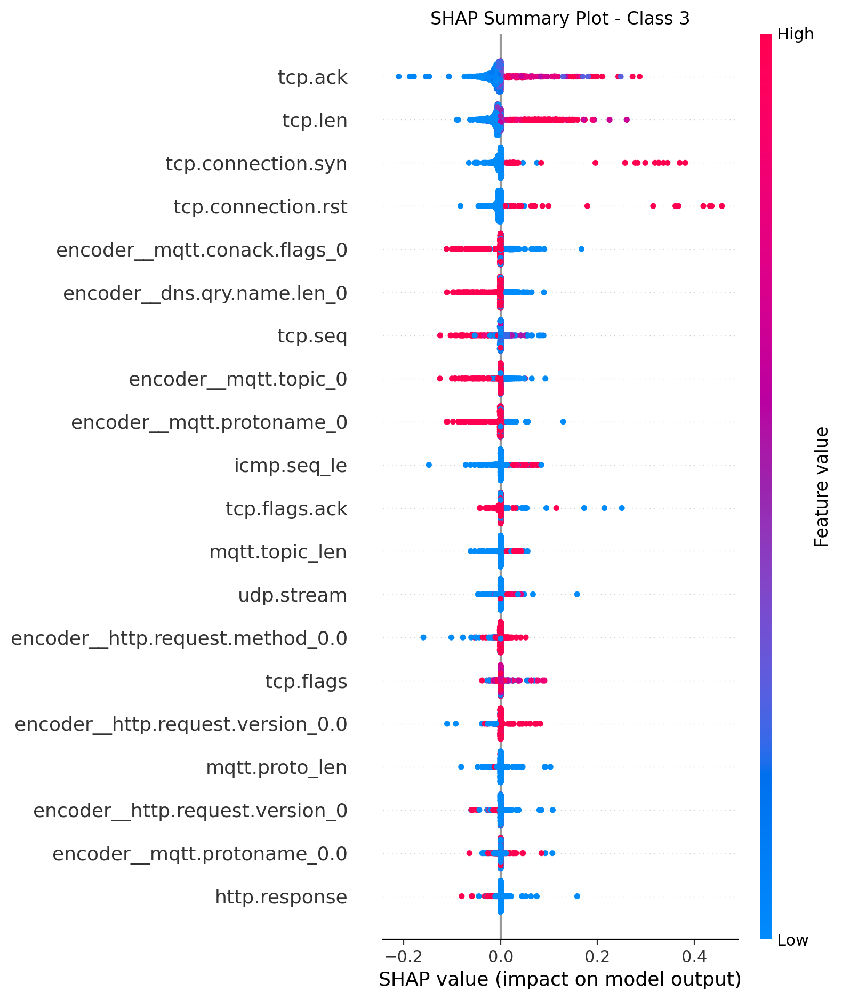

Creating waterfall plot for class 3...


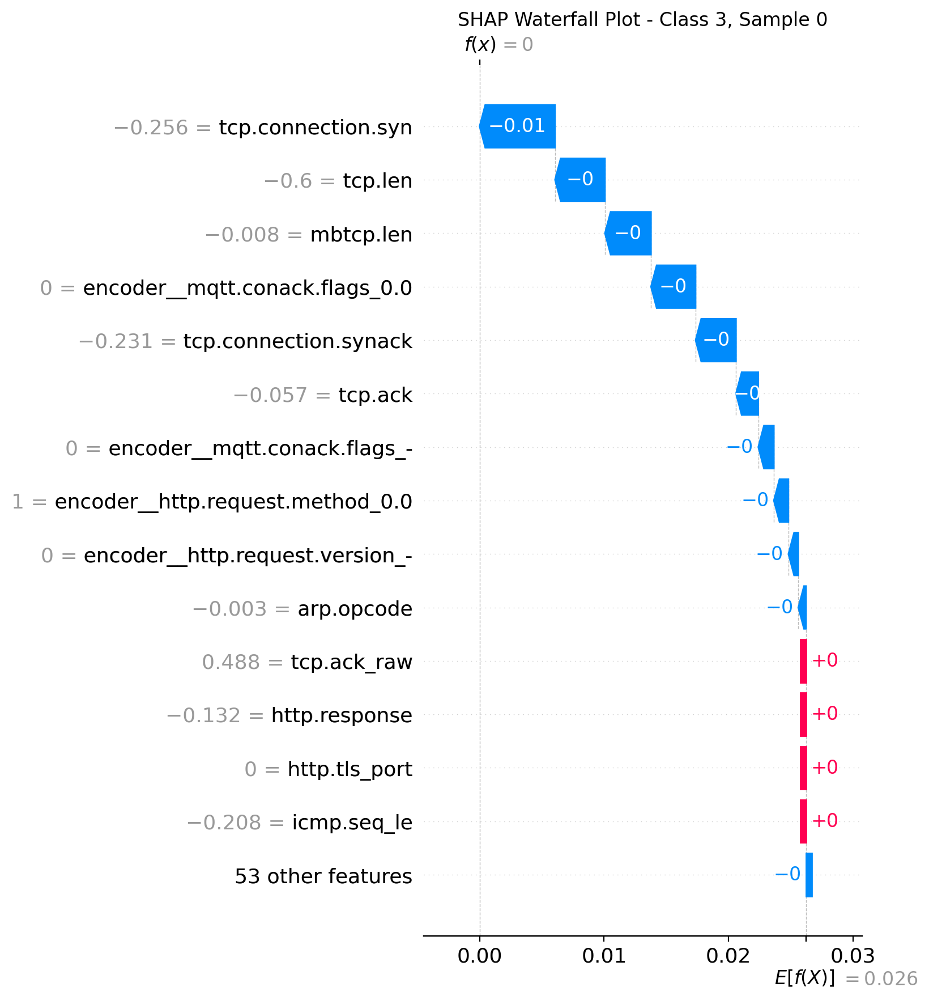


Explaining class 4...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.23it/s]


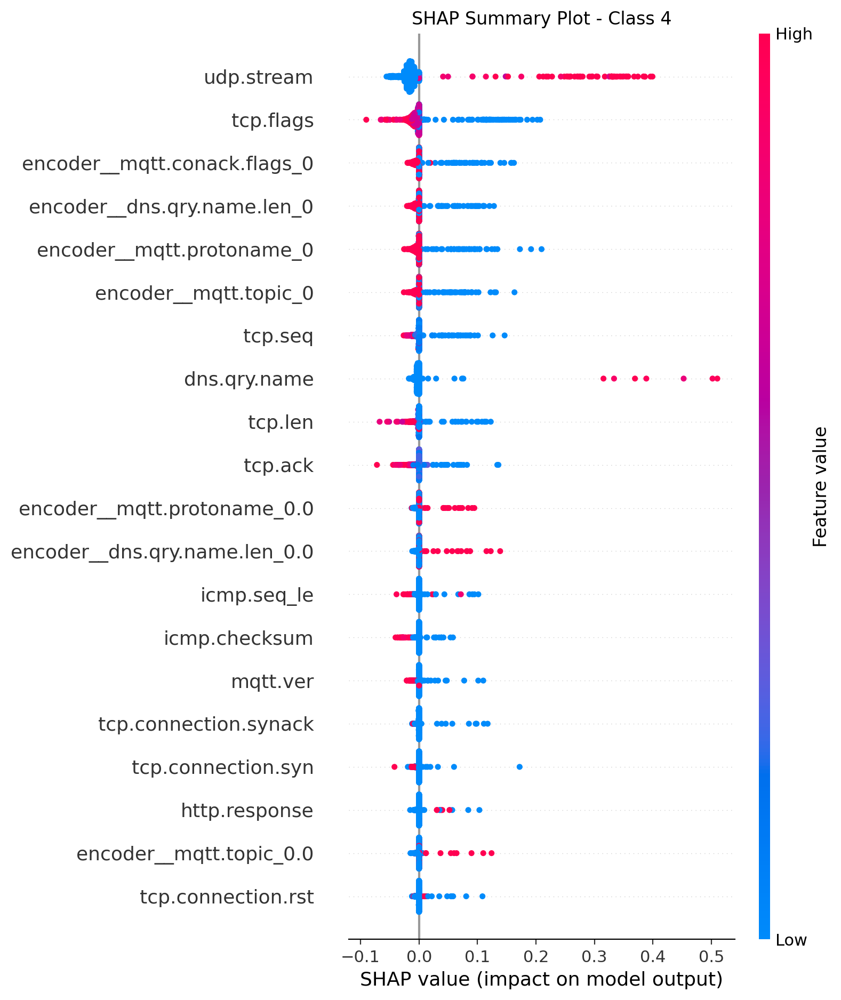

Creating waterfall plot for class 4...


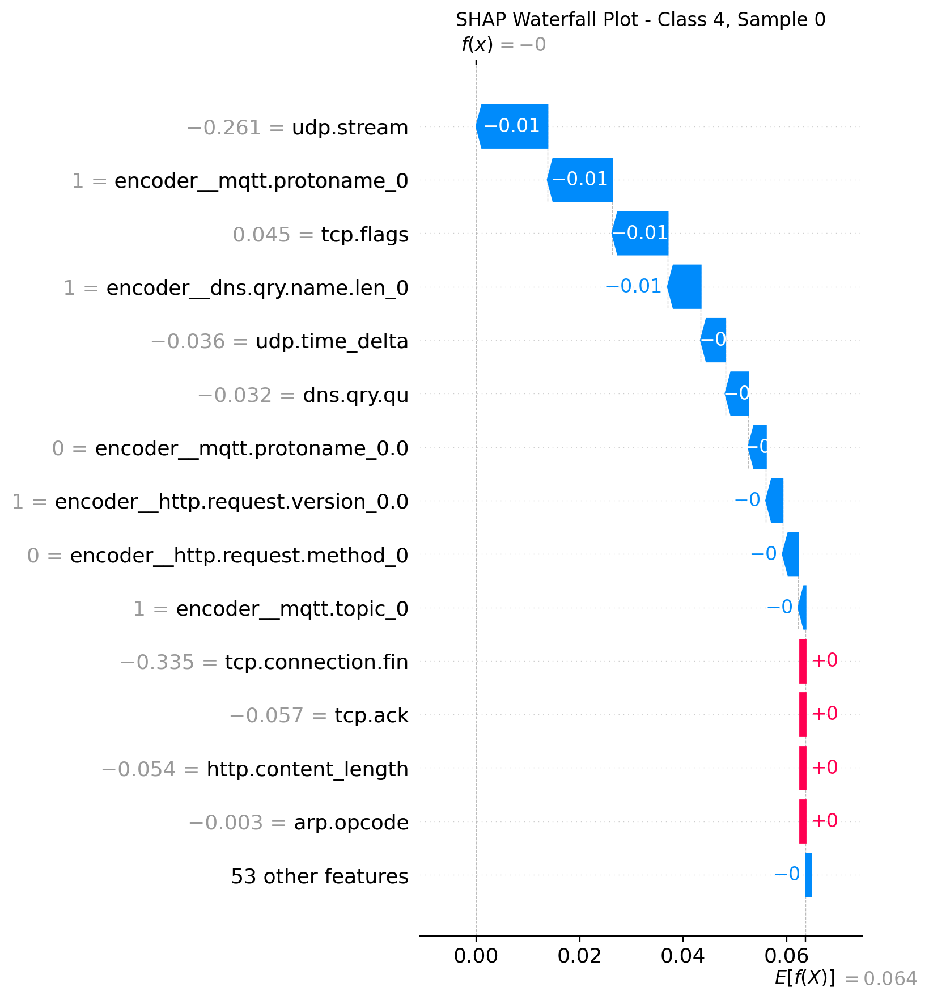


Explaining class 5...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 62.53it/s]


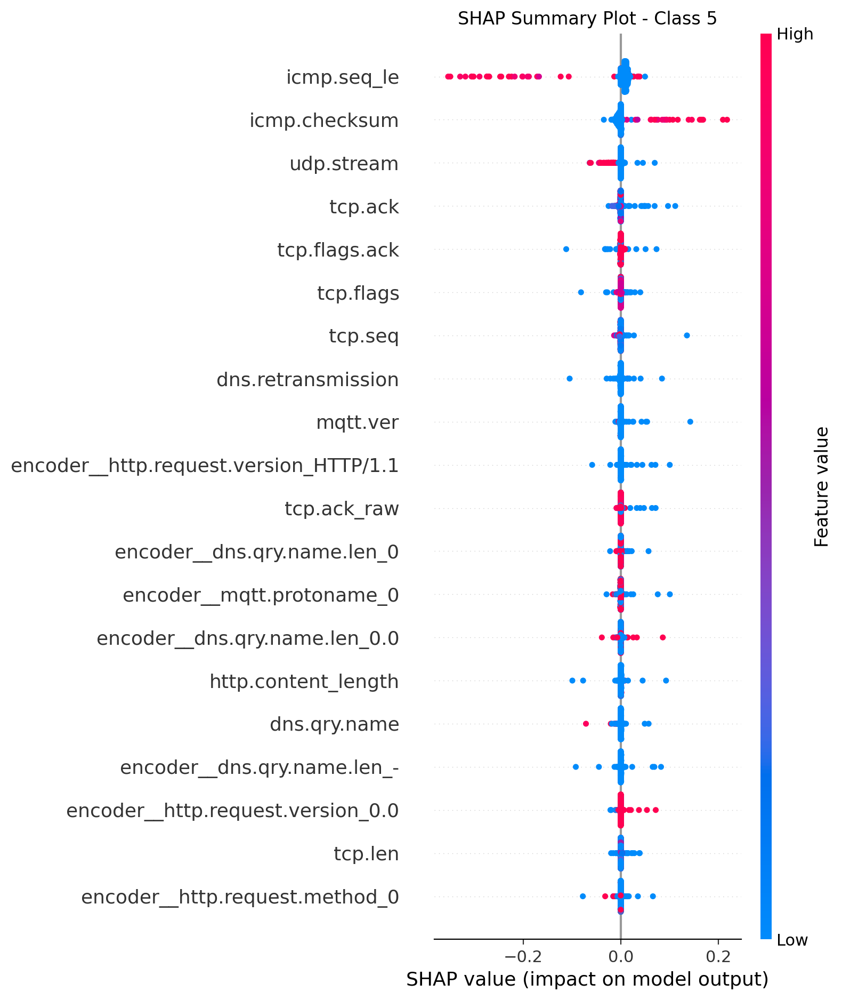

Creating waterfall plot for class 5...


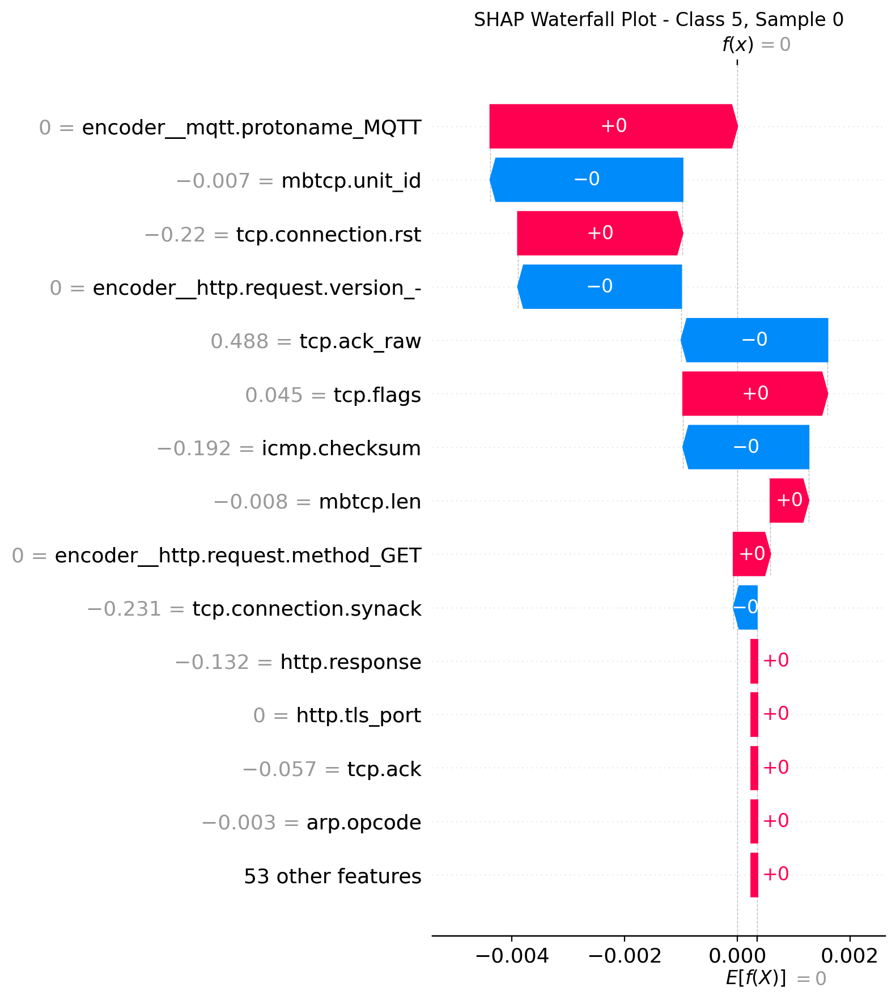


Explaining class 6...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.19it/s]


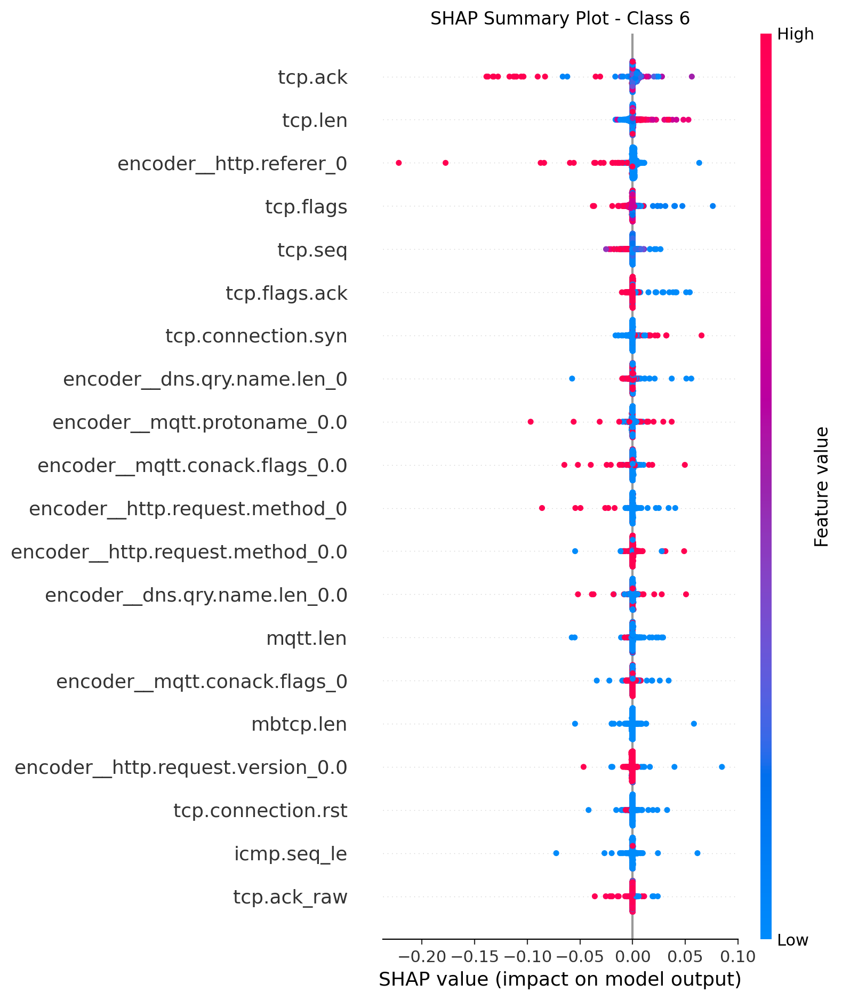

Creating waterfall plot for class 6...


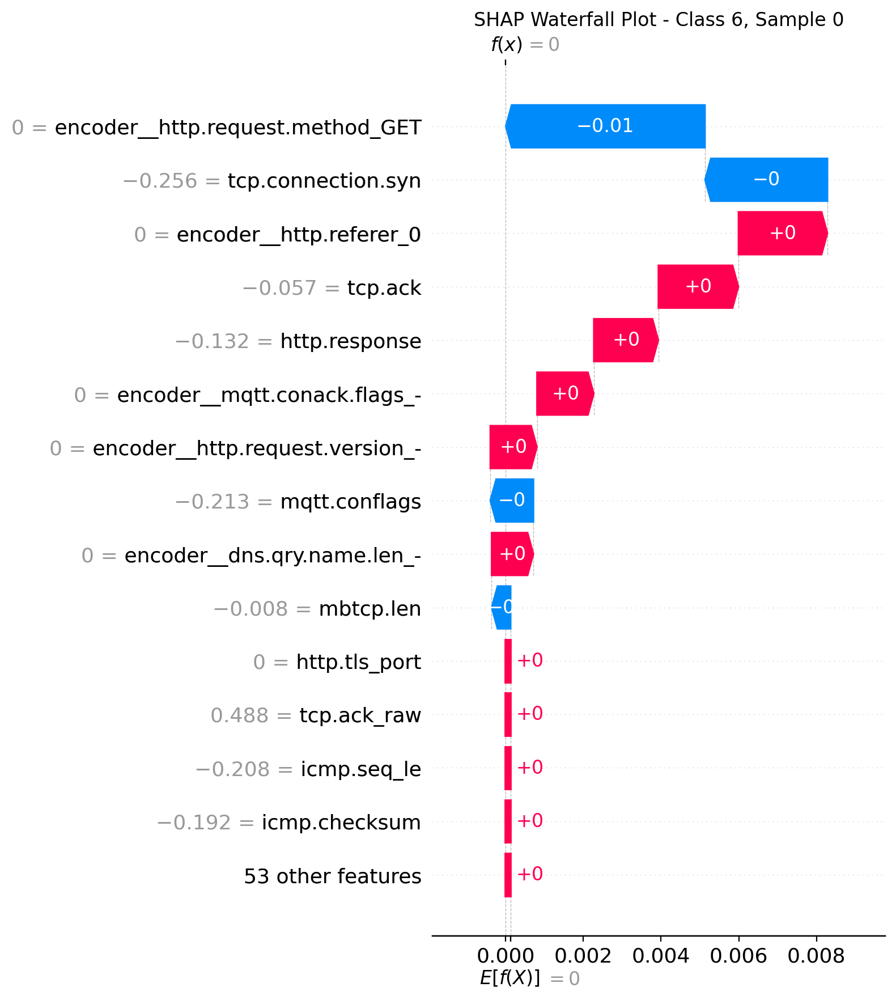


Explaining class 7...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.21it/s]


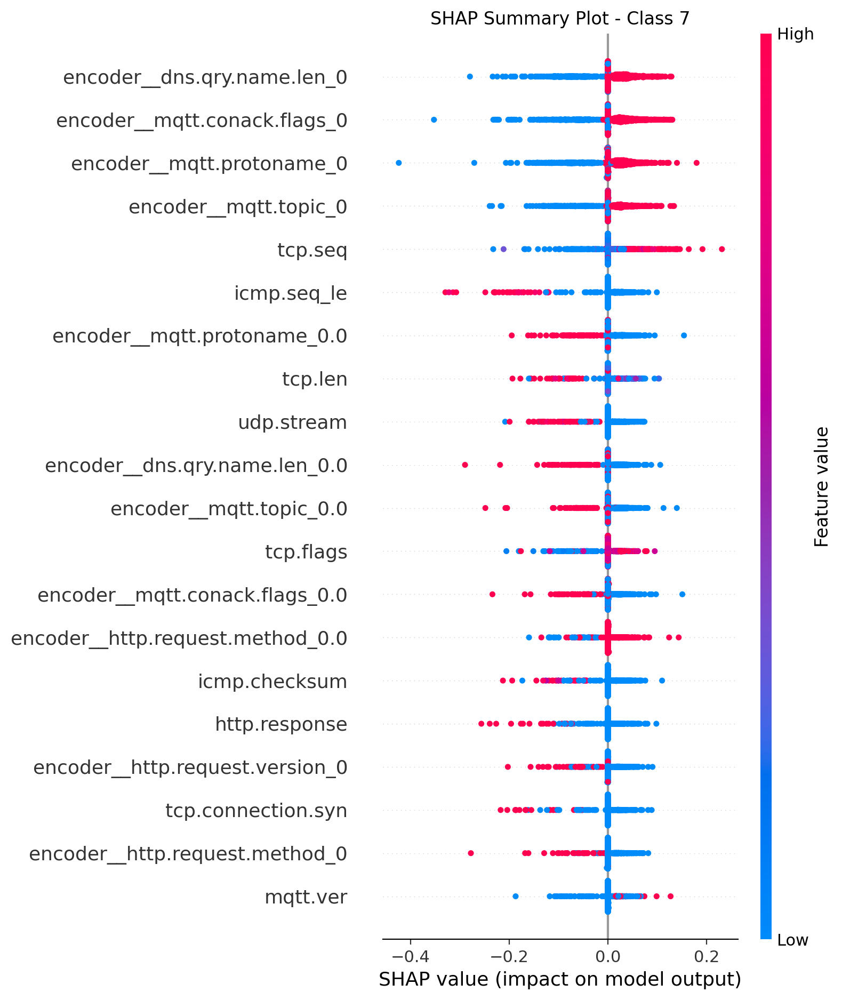

Creating waterfall plot for class 7...


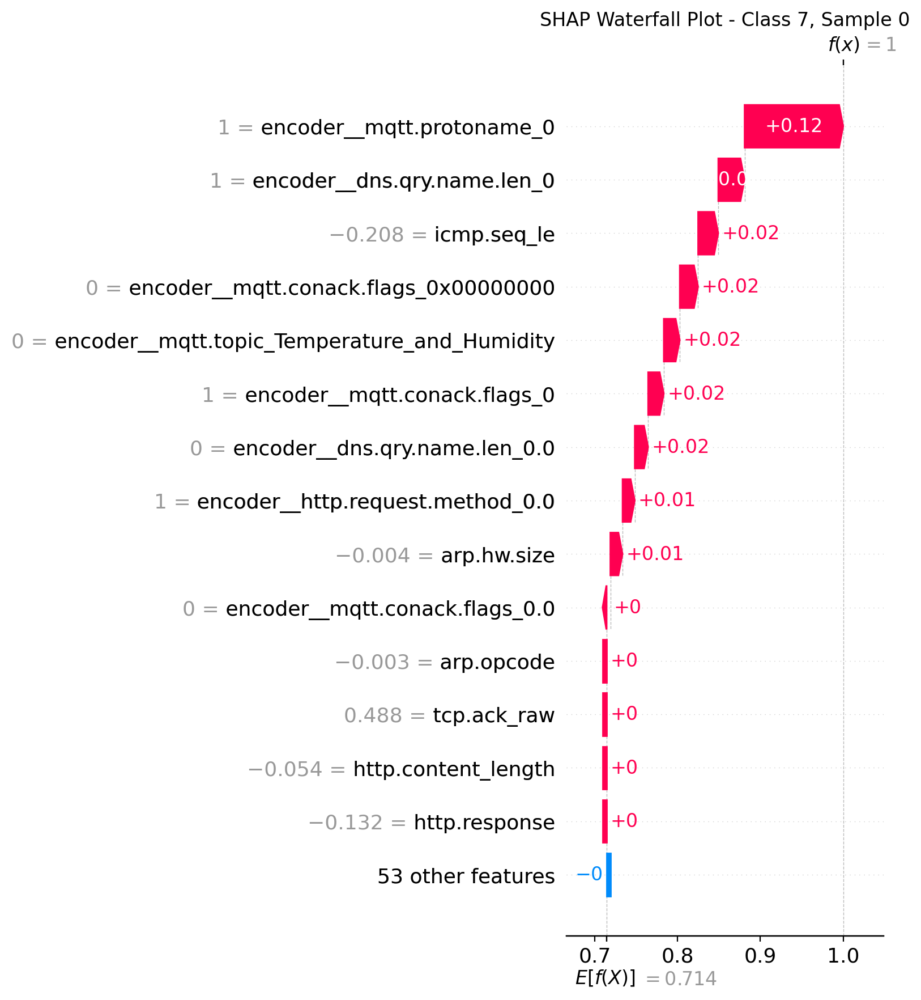


Explaining class 8...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 62.47it/s]


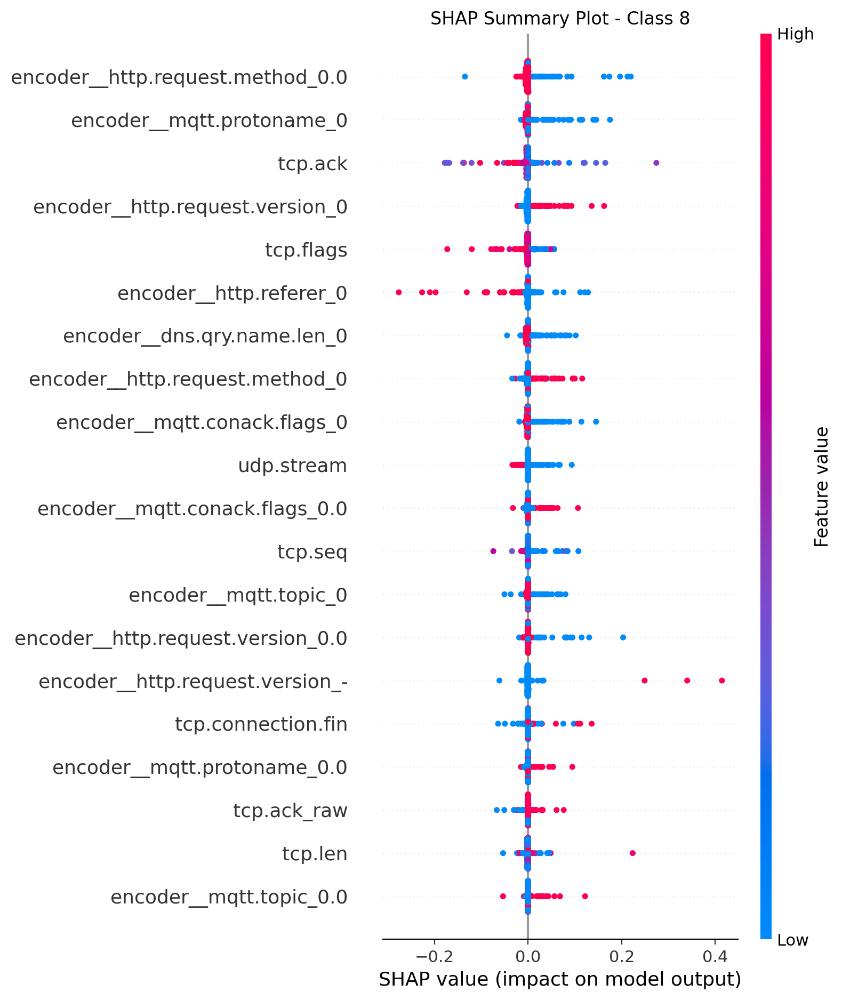

Creating waterfall plot for class 8...


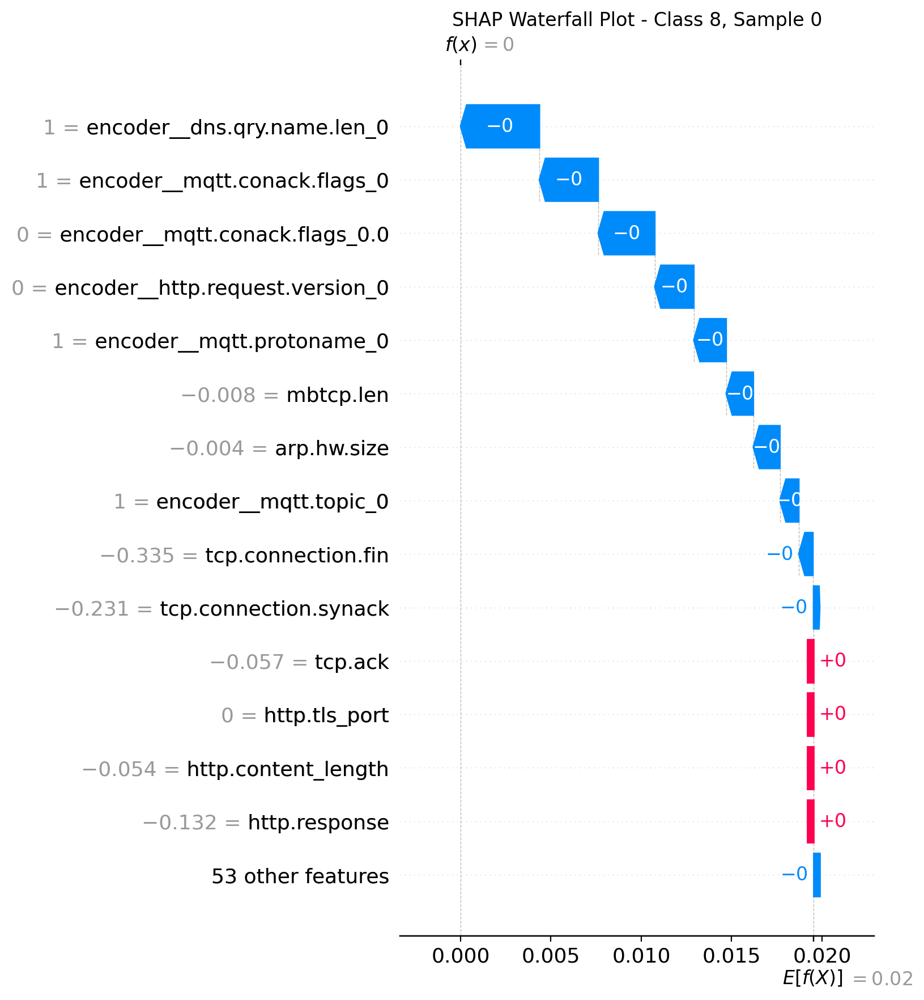


Explaining class 9...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.00it/s]


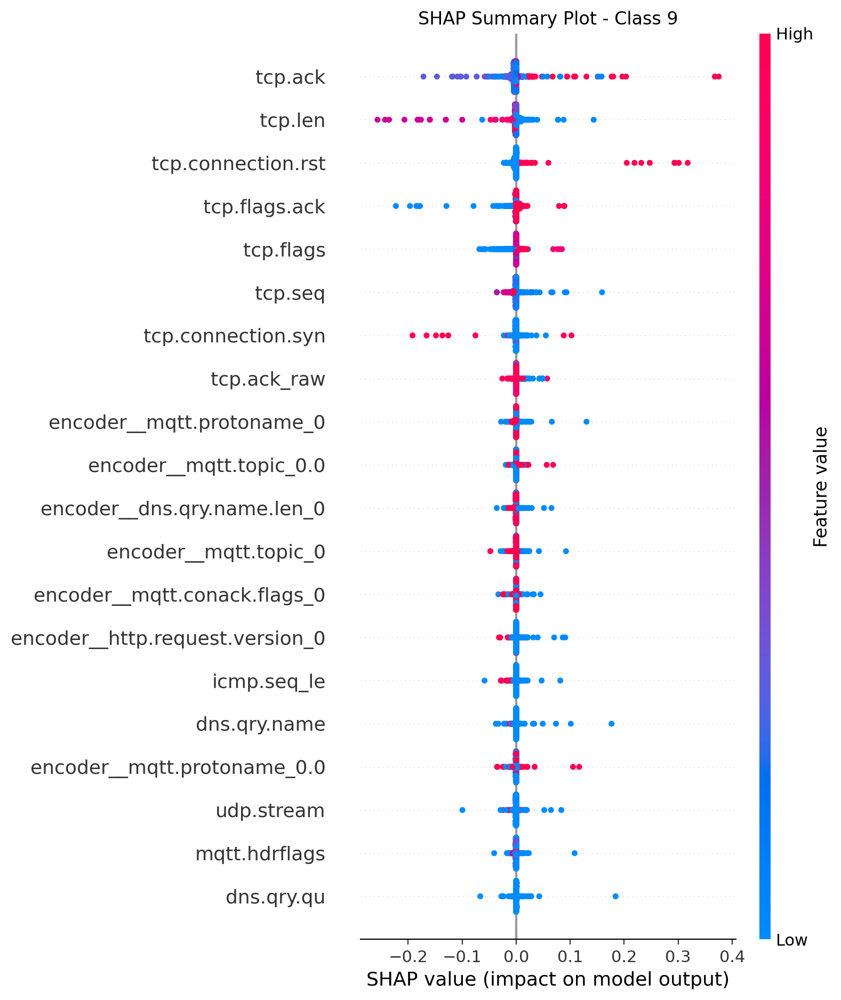

Creating waterfall plot for class 9...


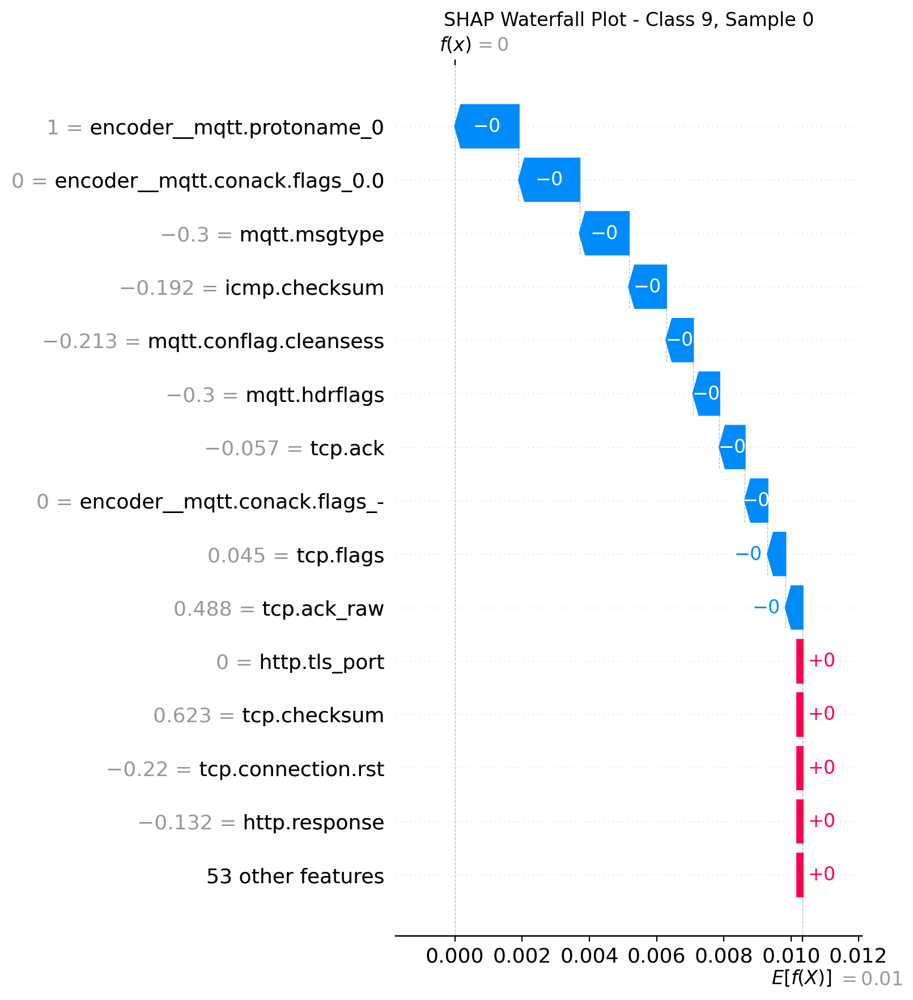


Explaining class 10...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.21it/s]


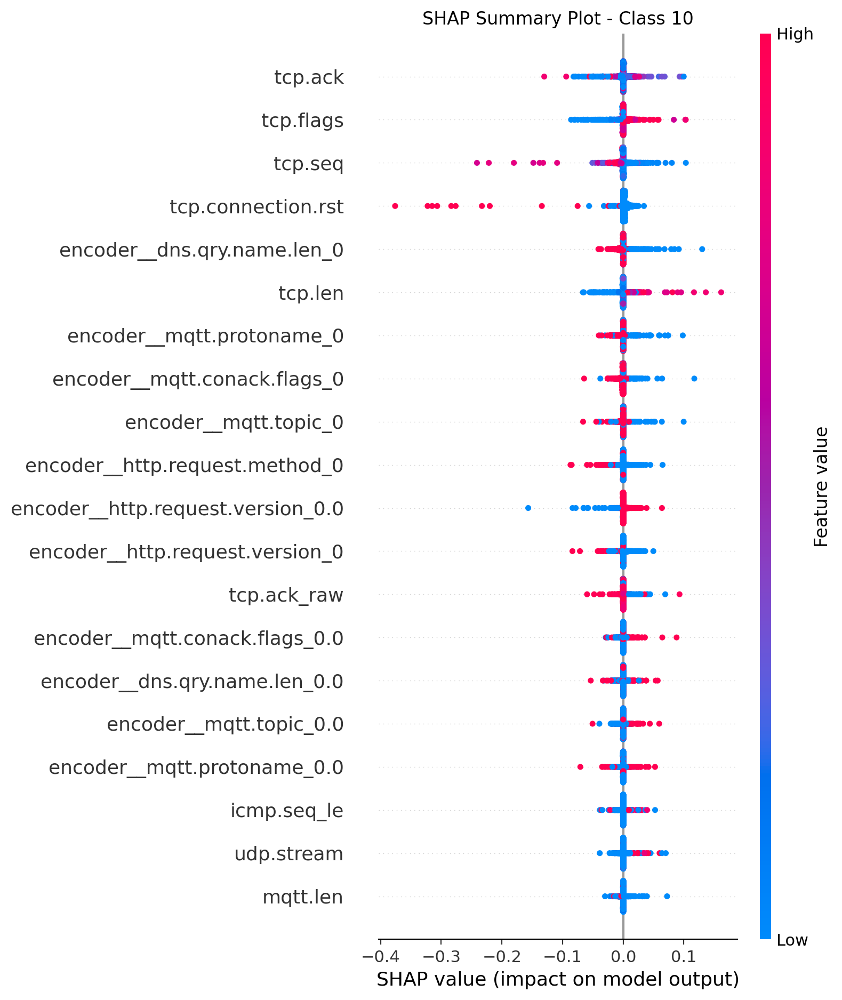

Creating waterfall plot for class 10...


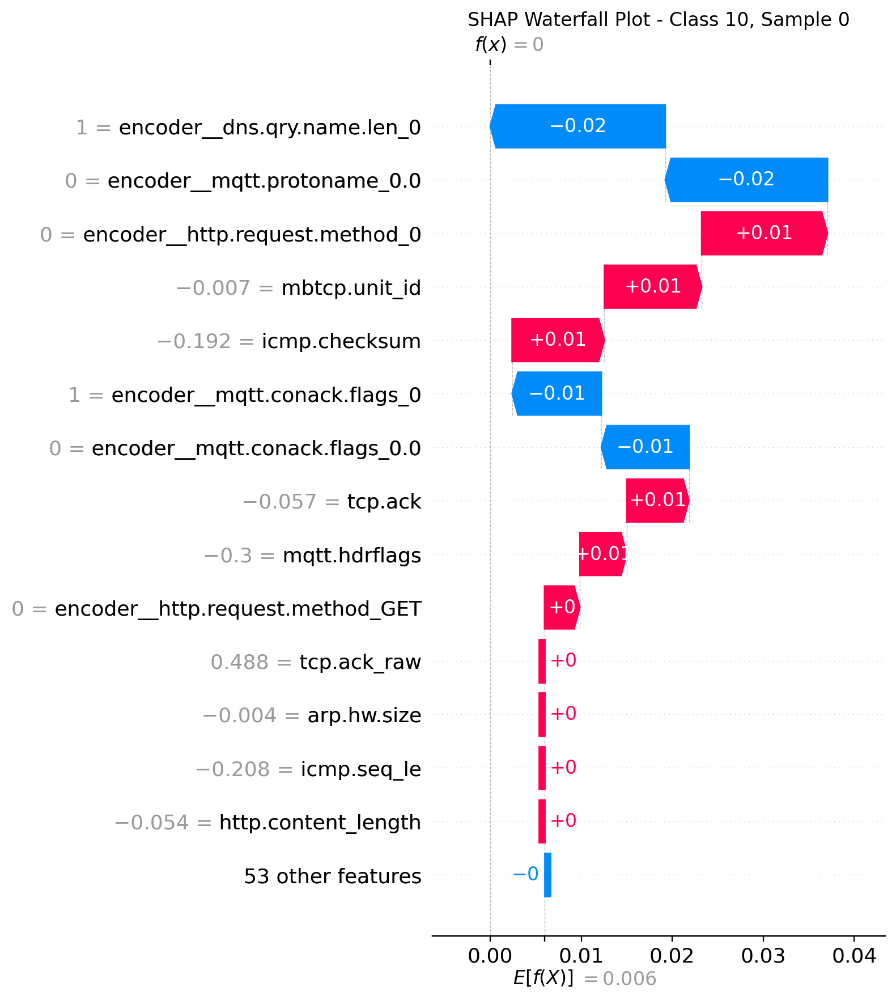


Explaining class 11...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.08it/s]


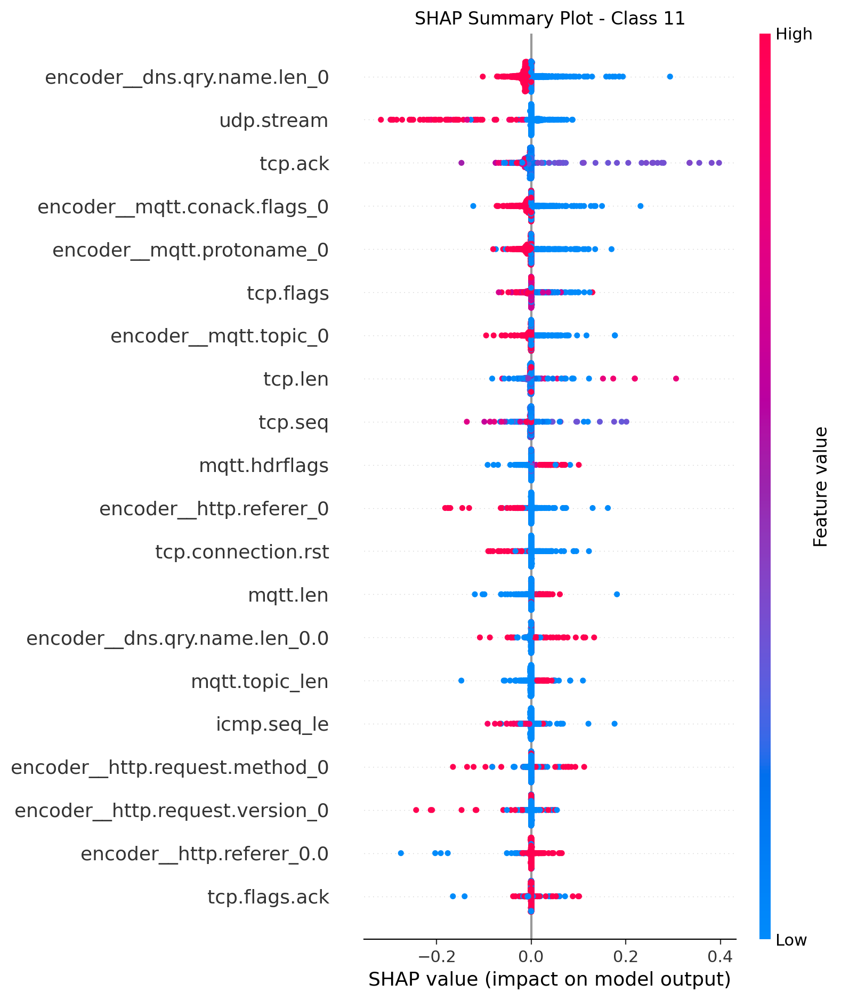

Creating waterfall plot for class 11...


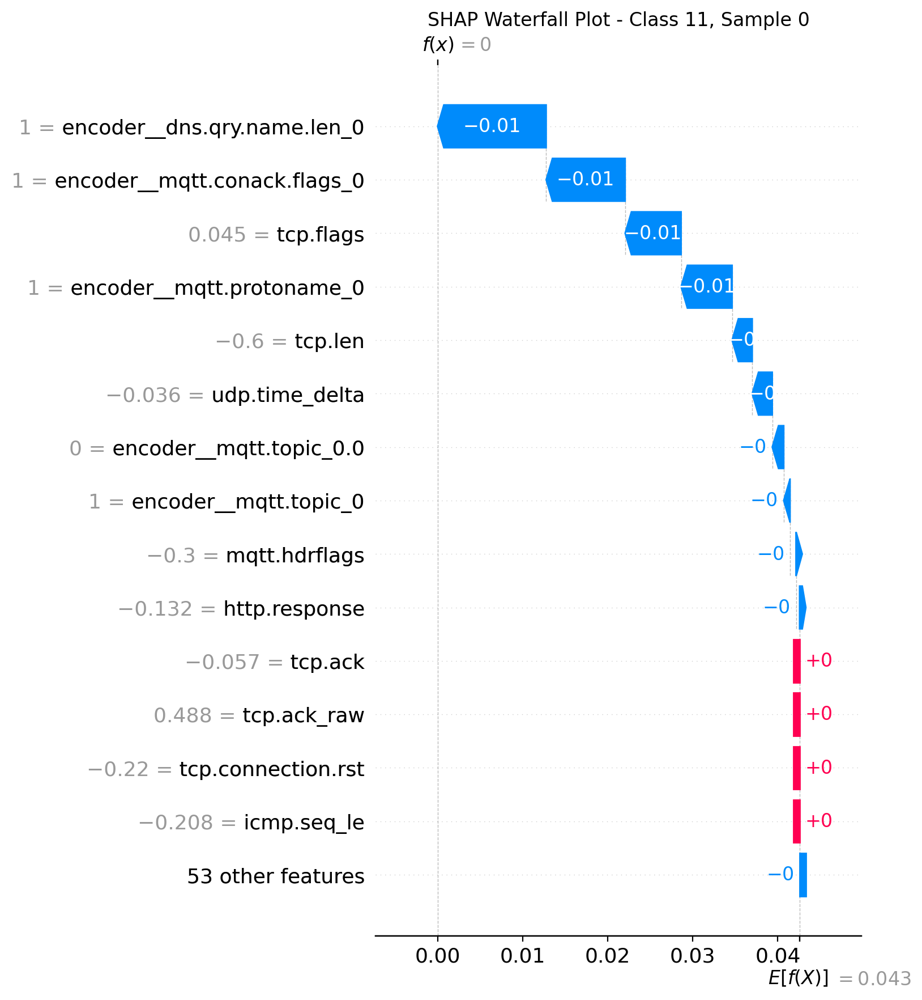


Explaining class 12...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.05it/s]


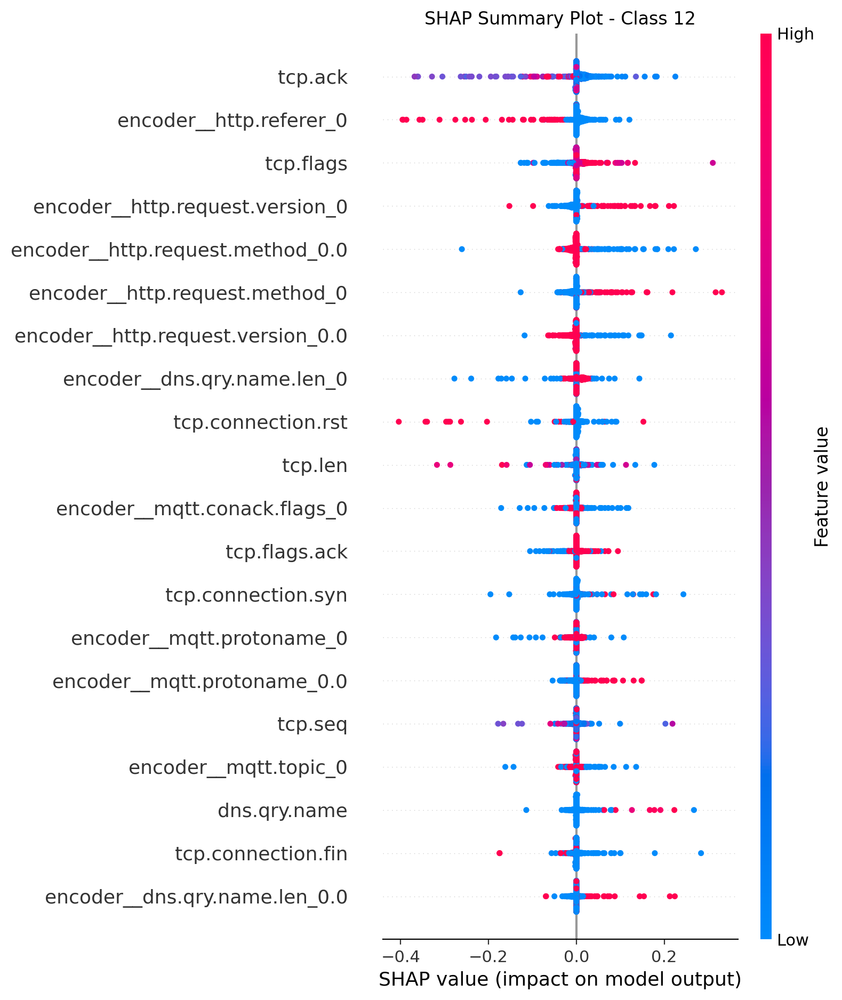

Creating waterfall plot for class 12...


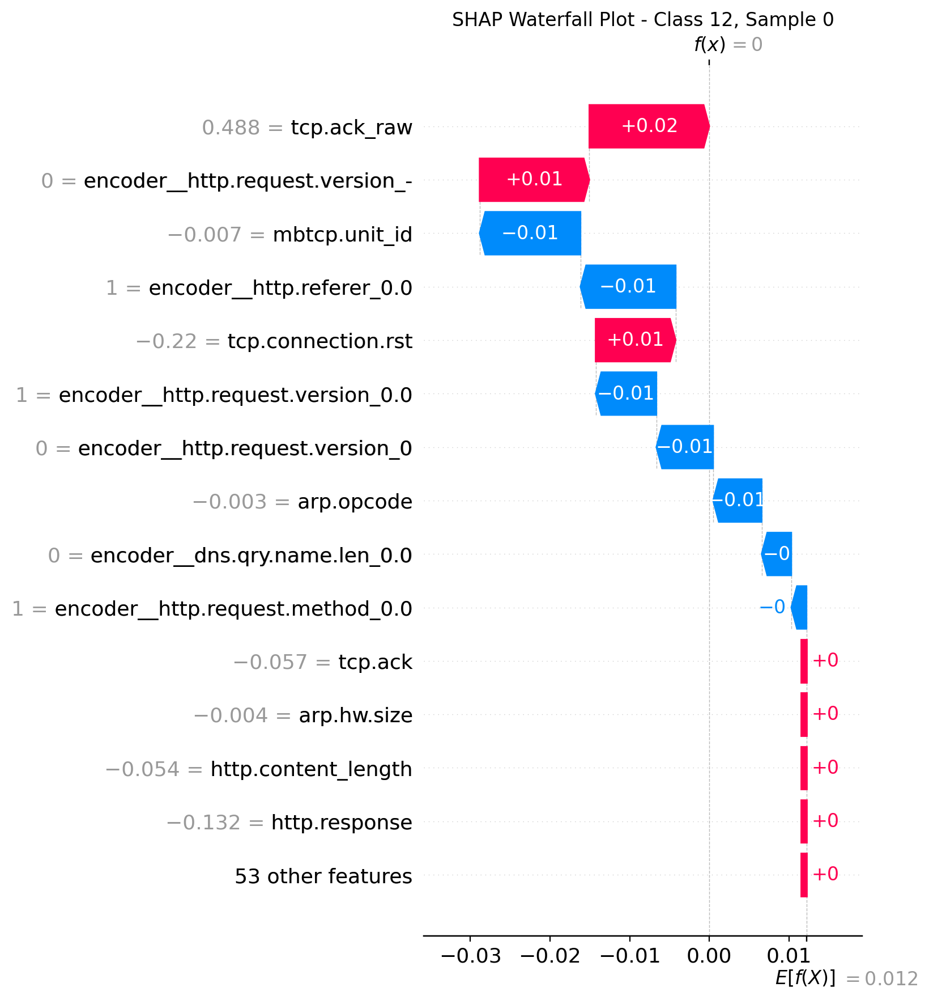


Explaining class 13...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.31it/s]


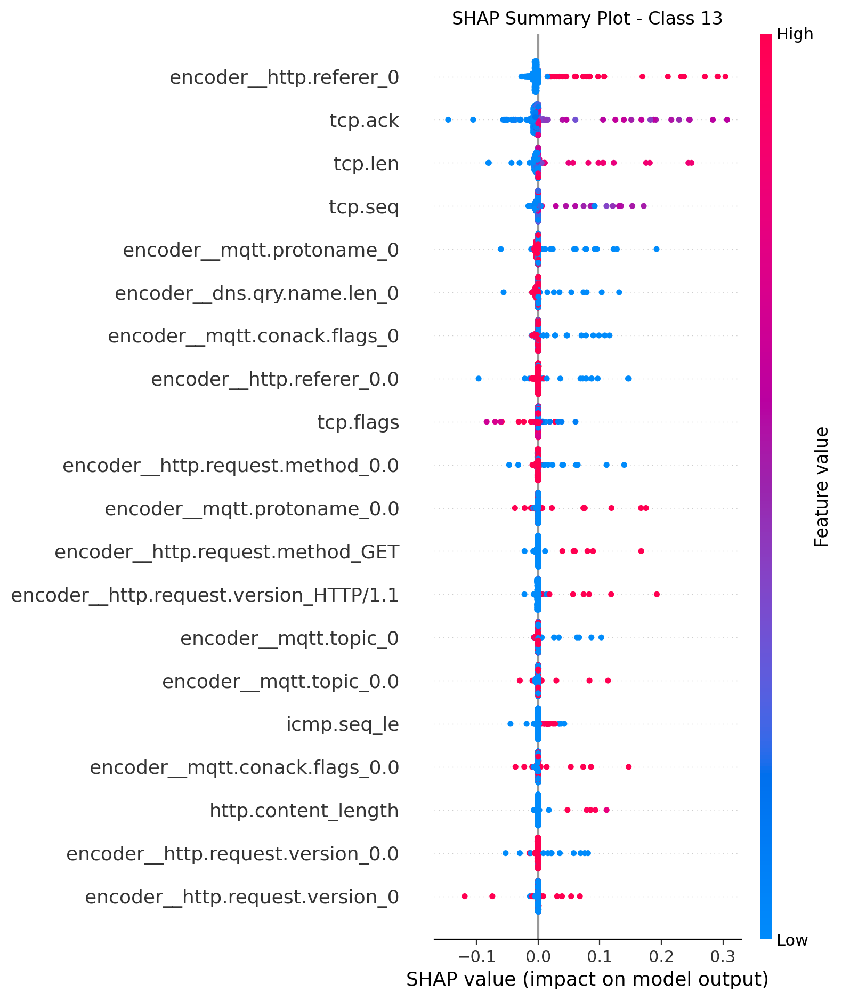

Creating waterfall plot for class 13...


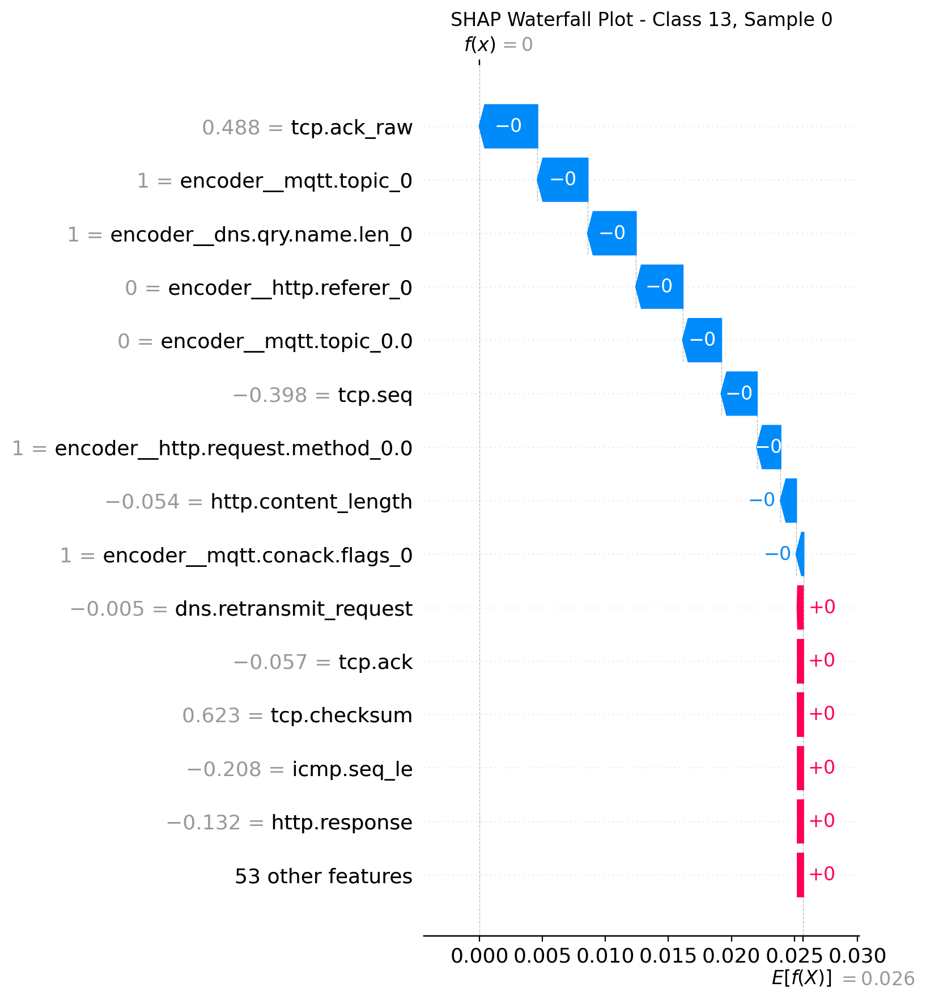


Explaining class 14...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.23it/s]


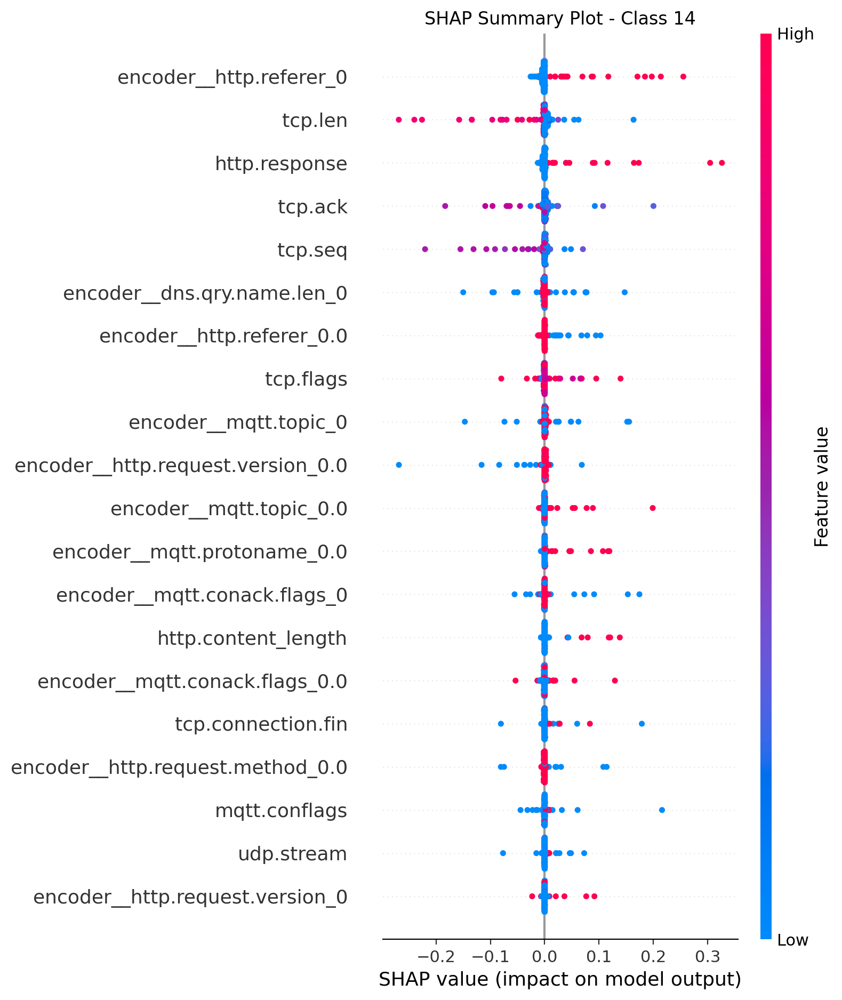

Creating waterfall plot for class 14...


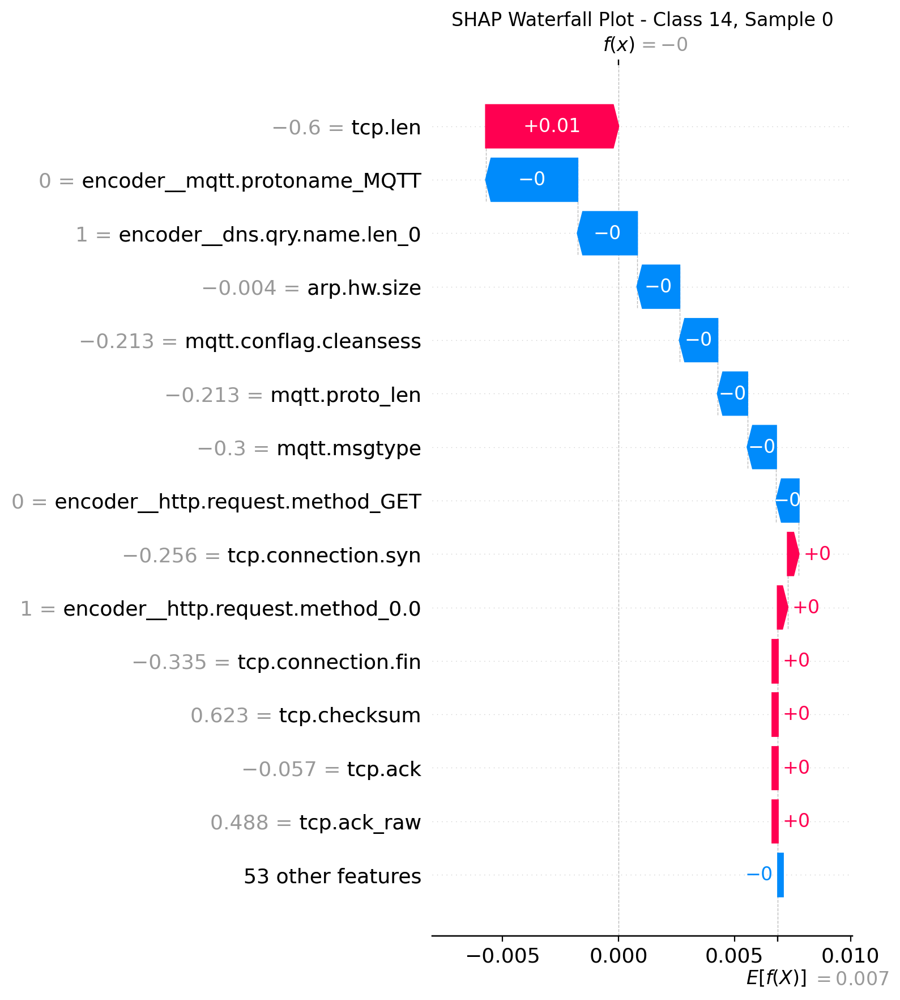


SHAP explanation generation completed!

=== Collecting SHAP values for comprehensive analysis ===
Computing SHAP values for class 0...


100%|██████████| 1000/1000 [00:15<00:00, 62.52it/s]


Computing SHAP values for class 1...


100%|██████████| 1000/1000 [00:16<00:00, 62.17it/s]


Computing SHAP values for class 2...


100%|██████████| 1000/1000 [1:48:32<00:00,  6.51s/it]  


Computing SHAP values for class 3...


100%|██████████| 1000/1000 [00:20<00:00, 48.98it/s]


Computing SHAP values for class 4...


100%|██████████| 1000/1000 [00:18<00:00, 54.23it/s]


Computing SHAP values for class 5...


100%|██████████| 1000/1000 [00:17<00:00, 58.45it/s]


Computing SHAP values for class 6...


100%|██████████| 1000/1000 [00:16<00:00, 59.97it/s]


Computing SHAP values for class 7...


100%|██████████| 1000/1000 [00:16<00:00, 61.37it/s]


Computing SHAP values for class 8...


100%|██████████| 1000/1000 [00:16<00:00, 60.37it/s]


Computing SHAP values for class 9...


100%|██████████| 1000/1000 [00:16<00:00, 61.05it/s]


Computing SHAP values for class 10...


100%|██████████| 1000/1000 [00:15<00:00, 62.58it/s]


Computing SHAP values for class 11...


100%|██████████| 1000/1000 [00:16<00:00, 61.76it/s]


Computing SHAP values for class 12...


100%|██████████| 1000/1000 [00:16<00:00, 61.23it/s]


Computing SHAP values for class 13...


100%|██████████| 1000/1000 [00:18<00:00, 53.55it/s]


Computing SHAP values for class 14...


100%|██████████| 1000/1000 [00:16<00:00, 61.36it/s]


=== Comprehensive Feature Importance Analysis ===

--- Class 0 Feature Importance (ALL 67 features) ---
                                                                                   feature  importance
                                                                                   tcp.ack    0.005864
                                                                                   tcp.seq    0.004231
                                                              encoder__mqtt.conack.flags_0    0.003930
                                                                 encoder__mqtt.protoname_0    0.003604
                                                               encoder__dns.qry.name.len_0    0.003453
                                                           encoder__http.request.version_0    0.003396
                                                                     encoder__mqtt.topic_0    0.003352
                                                                       

In [45]:
# === SHAP Explainability for Centralized Model ===
import shap
import numpy as np
import matplotlib.pyplot as plt

print(f"\nGenerating SHAP explanations...")

# Define prediction function for each class
def predict_class_prob(class_index):
    return lambda x: model.predict_proba(x)[:, class_index]

# Sample points to explain (reasonable size for demonstration)
sample_size = min(1000, len(X_test))  # Don't exceed available test data
X_explainer = X_test.sample(n=sample_size, random_state=42)

# === Use summarized background data for efficiency ===
# Reduce background size significantly for faster computation
background_size = 100
print(f"Creating background summary with {background_size} samples...")

# Option 1: K-means clustering (better representation of data distribution)
background_data = shap.kmeans(X_train, background_size)

# Option 2: Random sampling (faster but less representative)
# background_data = shap.sample(X_train, background_size)

# Get number of classes from model
n_classes = model.classes_.shape[0] if hasattr(model, 'classes_') else 2
print(f"Model has {n_classes} classes")

# Loop over all classes (or subset for demonstration)
classes_to_explain = min(15, n_classes)  # Limit to first 3 classes for demo
print(f"Explaining first {classes_to_explain} classes...")

for class_index in range(classes_to_explain):
    print(f"\nExplaining class {class_index}...")
    
    # Create Kernel SHAP explainer with summarized background
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        background_data
    )
    
    # Get SHAP values for the explained samples
    # Reduce nsamples for faster computation (100-300 is usually sufficient)
    print("Computing SHAP values...")
    shap_values = explainer.shap_values(X_explainer, nsamples=100)
    
    # Create summary plot
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values,
        X_explainer,
        feature_names=X_explainer.columns,
        plot_type="dot",
        show=False,  # Don't show immediately
        max_display=20  # Limit features shown
    )
    plt.title(f'SHAP Summary Plot - Class {class_index}')
    plt.tight_layout()
    plt.show()
    
    # Optional: Create waterfall plot for first few samples
    if len(X_explainer) > 0:
        print(f"Creating waterfall plot for class {class_index}...")
        plt.figure(figsize=(10, 6))
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_values[0],  # First sample
                base_values=explainer.expected_value,
                data=X_explainer.iloc[0].values,
                feature_names=X_explainer.columns.tolist()
            ),
            max_display=15,
            show=False
        )
        plt.title(f'SHAP Waterfall Plot - Class {class_index}, Sample 0')
        plt.tight_layout()
        plt.show()

print("\nSHAP explanation generation completed!")

# === Additional Analysis Options ===

# Store SHAP values for all classes
all_shap_values = []
all_class_indices = []

print("\n=== Collecting SHAP values for comprehensive analysis ===")
# Re-run the explanation loop to collect all SHAP values
for class_index in range(classes_to_explain):
    print(f"Computing SHAP values for class {class_index}...")
    
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        background_data
    )
    
    shap_values = explainer.shap_values(X_explainer, nsamples=100)
    all_shap_values.append(shap_values)
    all_class_indices.append(class_index)

# Feature importance aggregation across all samples and classes
def analyze_comprehensive_feature_importance(all_shap_values, feature_names, class_indices):
    """Analyze overall feature importance across all classes and all explained features"""
    print("\n=== Comprehensive Feature Importance Analysis ===")
    
    # Individual class analysis (showing ALL features)
    for class_idx, shap_vals in zip(class_indices, all_shap_values):
        print(f"\n--- Class {class_idx} Feature Importance (ALL {len(feature_names)} features) ---")
        
        # Mean absolute SHAP values for this class
        mean_abs_shap = np.abs(shap_vals).mean(axis=0)
        
        # Create feature importance DataFrame
        importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': mean_abs_shap
        }).sort_values('importance', ascending=False)
        
        # Print all features with their importance
        print(importance_df.to_string(index=False))
        print(f"\nSummary for Class {class_idx}:")
        print(f"  - Total features: {len(importance_df)}")
        print(f"  - Mean importance: {importance_df['importance'].mean():.6f}")
        print(f"  - Max importance: {importance_df['importance'].max():.6f}")
        print(f"  - Min importance: {importance_df['importance'].min():.6f}")
        print("-" * 80)
    
    # Global feature importance across all classes
    print(f"\n--- Global Feature Importance Across All Classes ---")
    
    # Combine SHAP values from all classes
    combined_shap = np.concatenate(all_shap_values, axis=0)
    global_importance = np.abs(combined_shap).mean(axis=0)
    
    global_importance_df = pd.DataFrame({
        'feature': feature_names,
        'global_importance': global_importance
    }).sort_values('global_importance', ascending=False)
    
    print("Global feature ranking (averaged across all classes and samples):")
    print(global_importance_df.to_string(index=False))
    
    print(f"\nGlobal Summary:")
    print(f"  - Total features analyzed: {len(global_importance_df)}")
    print(f"  - Mean global importance: {global_importance_df['global_importance'].mean():.6f}")
    print(f"  - Most important feature: {global_importance_df.iloc[0]['feature']} ({global_importance_df.iloc[0]['global_importance']:.6f})")
    print(f"  - Least important feature: {global_importance_df.iloc[-1]['feature']} ({global_importance_df.iloc[-1]['global_importance']:.6f})")
    
    return global_importance_df

# Run comprehensive analysis
if len(all_shap_values) > 0:
    comprehensive_results = analyze_comprehensive_feature_importance(
        all_shap_values, 
        X_explainer.columns.tolist(), 
        all_class_indices
    )